# Preliminary analysis of RCA in vitro trials (for multiple acquisition)

In [1]:
import os, sys
import tifffile as tif
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import tqdm
import pandas as pd
import colorcet as cc

import cv2
import skimage
import scipy.ndimage, scipy.stats

## Set up directory

In [2]:
data_dir = "/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging"

# list of all files in the directory
files = os.listdir(data_dir)
files = [os.path.join(data_dir, f) for f in files if f.endswith('.tif')]
# sort files by the number in the filename
files = sorted(files, key=lambda x: int(os.path.basename(x).replace('.tif', '').split('_')[-1]), reverse=True)
files = files[:-1]
files

['/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_100.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_80.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_60.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_40.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_20.tif']

## Raw image visualization

Visualize image for the thesis figure

In [3]:
processed_dir = os.path.join(data_dir, 'processed')
processed_files = os.listdir(processed_dir)
processed_files = [os.path.join(processed_dir, f) for f in processed_files if f.endswith('.tif')]
processed_files_488 = [f for f in processed_files if '488' in os.path.basename(f)]
processed_files_555 = [f for f in processed_files if '555' in os.path.basename(f)]

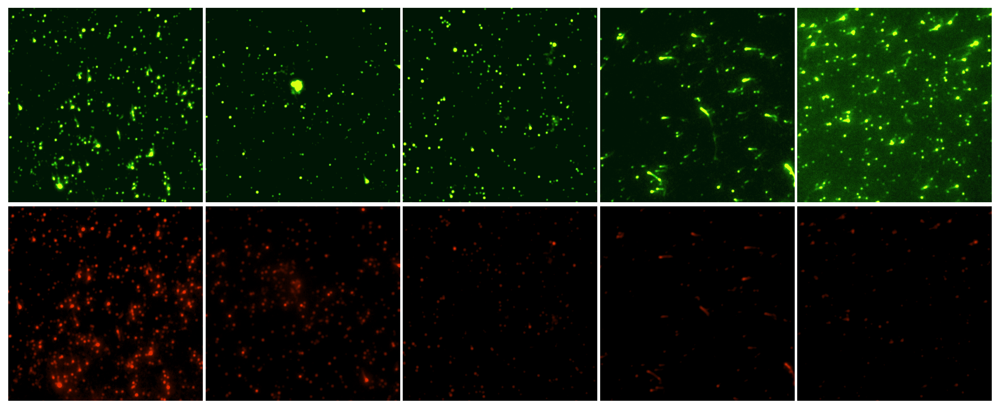

In [20]:
clim_488_max = 1500
clim_488_min = 700
clim_555_max = 7000
clim_555_min = 1500

plt.figure(figsize=(12, 5), dpi=200)
for i, f in enumerate(processed_files_488):
    img_488 = tif.imread(f)
    img_555 = tif.imread(f.replace('488', '555'))

    plt.subplot(2, len(processed_files_488), i + 1)
    plt.imshow(img_488, cmap=cc.cm.kgy, clim=(clim_488_min, clim_488_max))
    # plt.title(os.path.basename(f))
    plt.axis('off')
    plt.subplot(2, len(processed_files_488), i + 1 + len(processed_files_488))
    if '_100_' in f:
        plt.imshow(img_555, cmap=cc.cm.kr, clim=(clim_555_min+3500, clim_555_max+3500))
    else:
        plt.imshow(img_555, cmap=cc.cm.kr, clim=(clim_555_min, clim_555_max))
    plt.axis('off')

plt.tight_layout(pad=0.25)
plt.show()

## Exploratory analysis

In [5]:
file = files[0]
print(file)
img = tif.imread(file)
img_488 = img[1,:,:]
img_555 = img[2,:,:]

/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250413_RCA_fluo_imaging/100_to_100.tif


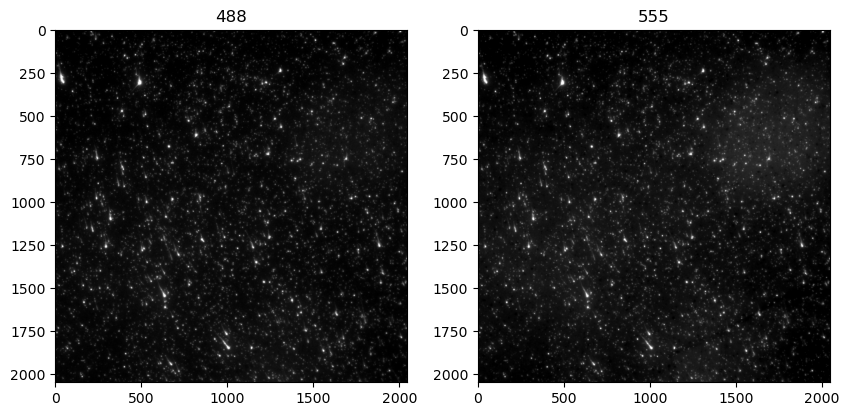

In [6]:
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(img_488, cmap='gray')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.title("488")
plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.title("555")
plt.show()

Plot a line profile in the diagonal direction

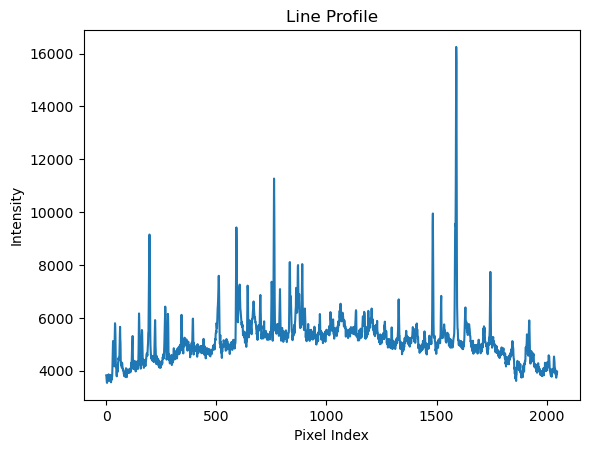

In [7]:
def plot_line_profile(img, start, end):
    # Create a mask for the line
    mask = np.zeros_like(img, dtype=np.uint8)
    cv2.line(mask, start, end, 255, 1)

    # Get the coordinates of the line
    coords = np.column_stack(np.where(mask > 0))

    # Get the pixel values along the line
    line_values = img[coords[:, 0], coords[:, 1]]

    # Plot the line profile
    plt.plot(line_values)
    plt.xlabel('Pixel Index')
    plt.ylabel('Intensity')
    plt.title('Line Profile')
    plt.show()
# Define the start and end points of the line
start = (0, 0)
end = (img_488.shape[1] - 1, img_488.shape[0] - 1)
# Plot the line profile for the first image
plot_line_profile(img_555, start, end)

## Background removal

Difference of guassian and then local maxima to detect spots

In [8]:
def vis_roll_ball(img, radius):
    # slightly blur the image to remove noise
    img = cv2.GaussianBlur(img, (5, 5), 0)
    # rolling ball algorithm to remove background
    background = skimage.restoration.rolling_ball(img, radius=radius)
    img_sub = img - background
    
    # set figure size
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.clim(np.percentile(img, 5), np.percentile(img, 99.9))
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(background, cmap='gray')
    plt.title('Background')
    plt.clim(np.percentile(background, 5), np.percentile(background, 99.9))
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(img_sub, cmap='gray')
    plt.title('Subtracted Image')
    plt.clim(np.percentile(img_sub, 5), np.percentile(img_sub, 99.9))
    plt.axis('off')

    plt.show()

    start = (0, 0)
    end = (img_sub.shape[1] - 1, img_sub.shape[0] - 1)
    plot_line_profile(img_sub, start, end)
    
def vis_gaussian(img, sigma1, sigma2):
    # difference of guassian sigma1 = 2, sigma2 = 10
    img_sig1 = skimage.filters.gaussian(img, sigma=sigma1, preserve_range=True)
    img_sig2 = skimage.filters.gaussian(img, sigma=sigma2, preserve_range=True)
    img_sub = img_sig1 - img_sig2
    
    return img_sub

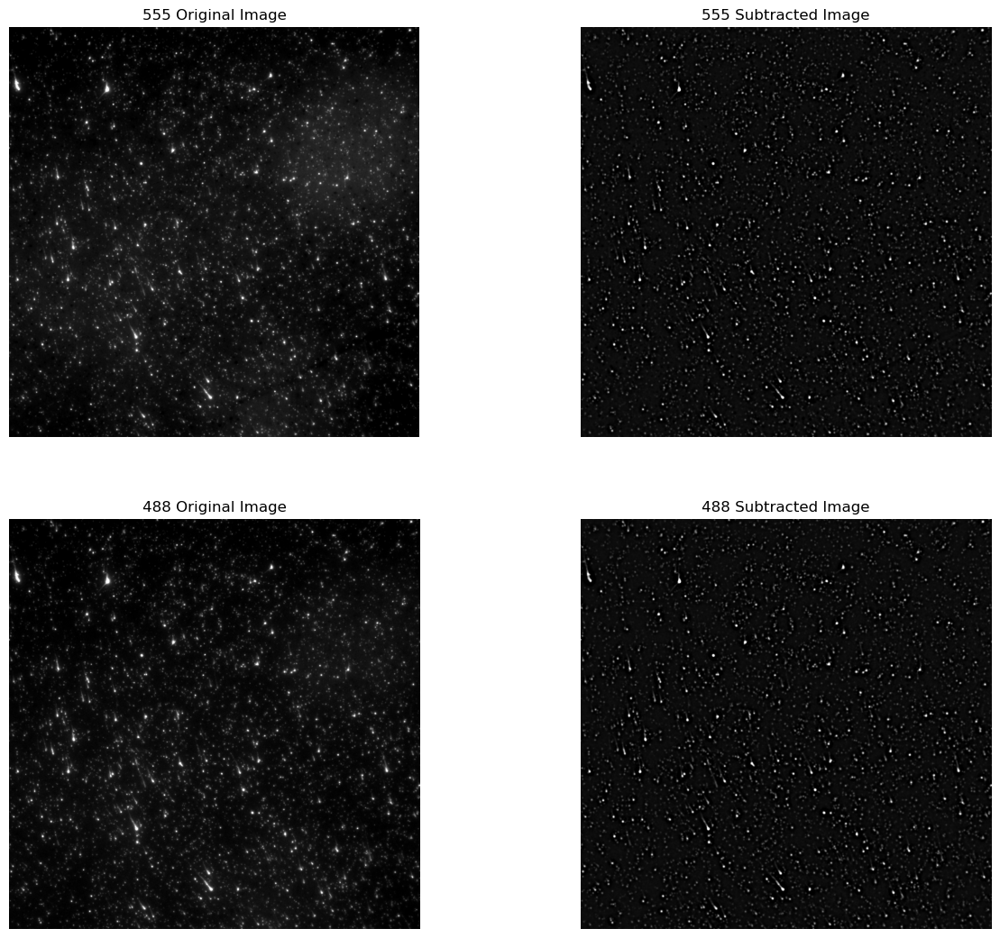

In [9]:
img_555_sub = vis_gaussian(img_555, 2, 10)
img_488_sub = vis_gaussian(img_488, 2, 10)

plt.figure(figsize=(15, 13), dpi=100)
plt.subplot(221)
plt.imshow(img_555, cmap='gray')
plt.title('555 Original Image')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.axis('off')
plt.subplot(222)
plt.imshow(img_555_sub, cmap='gray')
plt.title('555 Subtracted Image')
plt.clim(np.percentile(img_555_sub, 5), np.percentile(img_555_sub, 99.9))
plt.axis('off')
plt.subplot(223)
plt.imshow(img_488, cmap='gray')
plt.title('488 Original Image')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.axis('off')
plt.subplot(224)
plt.imshow(img_488_sub, cmap='gray')
plt.title('488 Subtracted Image')
plt.clim(np.percentile(img_488_sub, 5), np.percentile(img_488_sub, 99.9))
plt.axis('off')
plt.show()

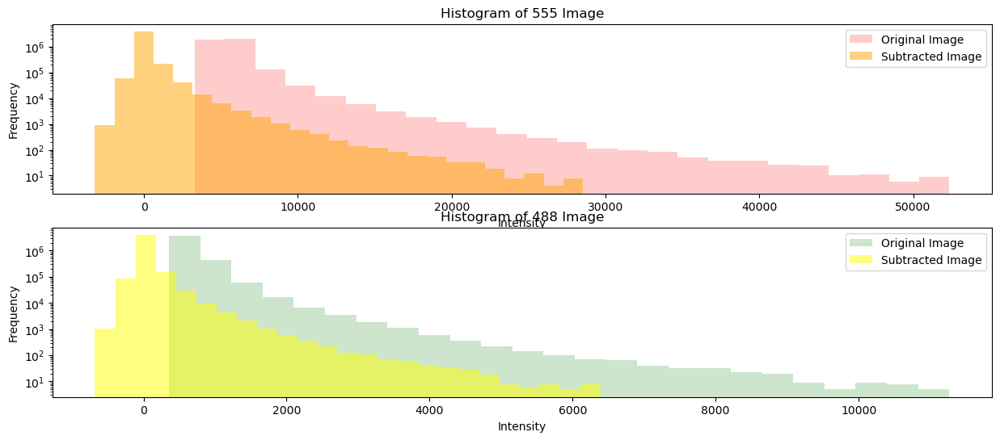

In [10]:

# plot the histogram before and after background subtraction
plt.figure(figsize=(15, 6), dpi=100)
plt.subplot(211)
# plt.hist(img_555_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_555.flatten(), bins=25, color='red', alpha=0.2, label='Original Image')
plt.hist(img_555_sub.flatten(), bins=25, color='orange', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 555 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
# set y into log
plt.yscale('log')
plt.legend()
plt.subplot(212)
# plt.hist(img_488_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_488.flatten(), bins=25, color='green', alpha=0.2, label='Original Image')
plt.hist(img_488_sub.flatten(), bins=25, color='yellow', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 488 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.yscale('log')
plt.legend()
plt.show()

## Peak detection and binarization

Local max (circular kernel)

In [11]:
def maximum_filter(img, radius):
    # set a circular kernel
    kernel = cv2.circle(np.zeros((radius*2+1, radius*2+1), dtype=np.uint8), (radius, radius), radius, 1, -1)
    
    # apply the maximum filter using the circular kernel, consider a reflective border
    img_max = cv2.dilate(img, kernel, iterations=1)
    return img_max

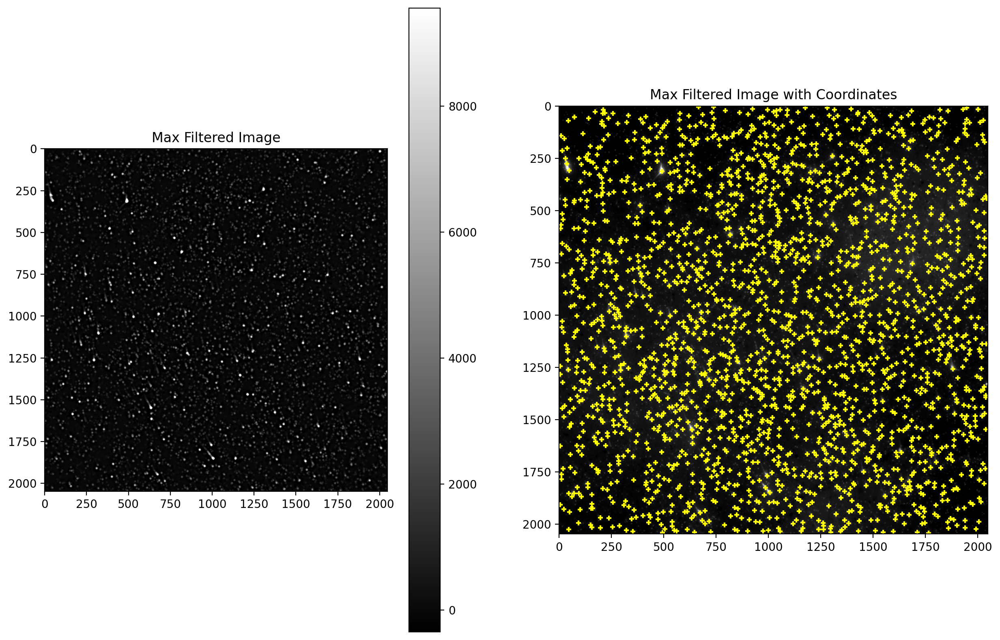

In [12]:
# img_555_max = scipy.ndimage.maximum_filter(img_555_sub, size=5)
img_555_max = maximum_filter(img_555_sub, radius=2)
thres =1500
coordinates = skimage.feature.peak_local_max(img_555_sub, min_distance=5, threshold_abs=thres)

plt.figure(figsize=(15, 10), dpi=200)
plt.subplot(121)
plt.imshow(img_555_max, cmap='gray')
plt.title('Max Filtered Image')
plt.clim(np.percentile(img_555_max, 5), np.percentile(img_555_max, 99.9))
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)
plt.colorbar()

plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('Max Filtered Image with Coordinates')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))

# plt.colorbar()
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')
    
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)
    
plt.show()

Coarse peak intensity correlation

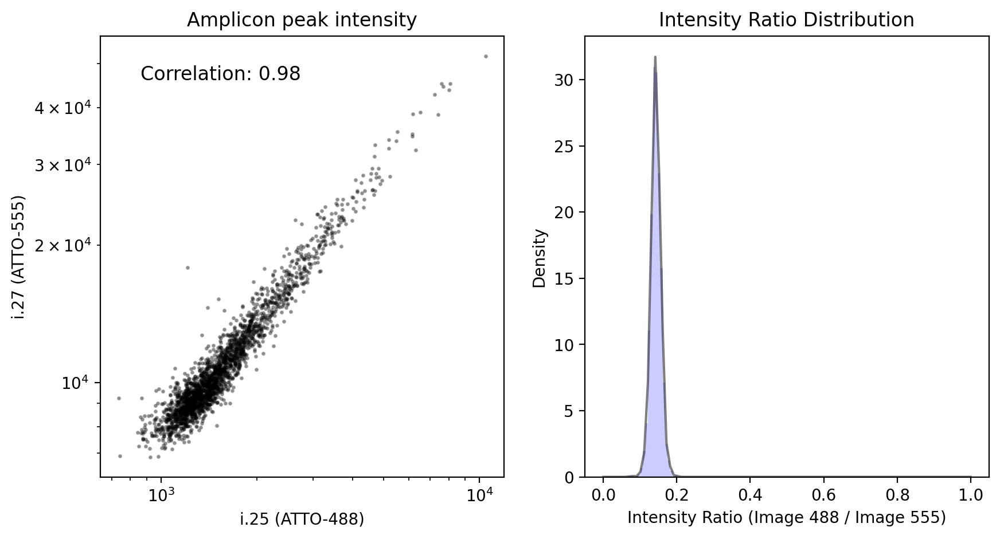

In [13]:
# plot a scatter plot correlating the intensity of img_488 and img_555 in the same coordinates
def plot_scatter(img1, img2, coordinates):
    # Get the pixel values at the coordinates
    values1 = img1[coordinates[:, 0], coordinates[:, 1]]
    values2 = img2[coordinates[:, 0], coordinates[:, 1]]

    # remove data pair if any of them is higher than 60000
    mask = (values1 < 60000) & (values2 < 60000)
    values1 = values1[mask]
    values2 = values2[mask]
    
    # ratio
    ratio = values1/values2
    
    # Plot the scatter plot
    plt.figure(figsize=(10,5), dpi = 200)
    plt.subplot(121)
    plt.scatter(values1, values2, c='black', s=10, alpha=0.3, marker='.')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('i.25 (ATTO-488)')
    plt.ylabel('i.27 (ATTO-555)')
    plt.title('Amplicon peak intensity')
    # compute the correlation coefficient
    correlation = np.corrcoef(values1, values2)[0, 1]
    plt.text(0.1, 0.9, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes, fontsize=12)
    
    plt.subplot(122)
    # plot a smoothened histogram of the intensity ratio
    plt.hist(ratio, bins=20, color='blue', alpha=0.2, density=True)
    kde = scipy.stats.gaussian_kde(ratio)
    x = np.linspace(0, 1, 100)
    plt.plot(x, kde(x), color='black', alpha=0.5)
    plt.xlabel('Intensity Ratio (Image 488 / Image 555)')
    plt.ylabel('Density')
    plt.title('Intensity Ratio Distribution')
    
    plt.show()
    
    
    
# Convert coordinates to a numpy array
coordinates = np.array(coordinates)
# Plot the scatter plot
plot_scatter(img_488, img_555, coordinates)

whole-amplicon intensity correlation

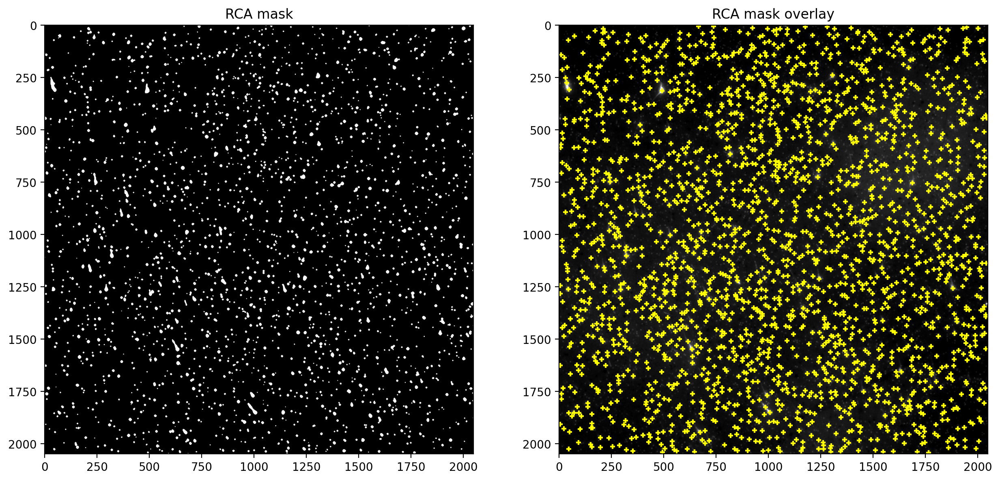

In [14]:
img_mask = img_555_max > thres

plt.figure(figsize=(15, 10), dpi = 200)
plt.subplot(121)
plt.imshow(img_mask, cmap='gray')
plt.title('RCA mask')
plt.clim(0, 1)
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)

plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('RCA mask overlay')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)
plt.show()

In [15]:
# turn the mask into a label image
img_mask = skimage.measure.label(img_mask)
img_488_df = skimage.measure.regionprops_table(img_mask, img_488, properties=['label', 'area', 'mean_intensity'])
img_555_df = skimage.measure.regionprops_table(img_mask, img_555, properties=['label', 'area', 'mean_intensity'])

In [16]:
img_488_df = pd.DataFrame(img_488_df)
img_555_df = pd.DataFrame(img_555_df)

# add one column to store area*mean_intensity as total_intensity
img_488_df['total_intensity'] = img_488_df['area'] * img_488_df['mean_intensity']
img_555_df['total_intensity'] = img_555_df['area'] * img_555_df['mean_intensity']
# merge the two dataframes on label
img_df = pd.merge(img_488_df, img_555_df, on='label', suffixes=('_488', '_555'))

img_df

,label,area_488,mean_intensity_488,total_intensity_488,area_555,mean_intensity_555,total_intensity_555
0,1,151.0,1226.158940,185150.0,151.0,8306.337748,1254257.0
1,2,24.0,875.083333,21002.0,24.0,7649.583333,183590.0
2,3,83.0,1080.518072,89683.0,83.0,7931.493976,658314.0
3,4,28.0,880.142857,24644.0,28.0,6805.607143,190557.0
4,5,12.0,706.666667,8480.0,12.0,6444.166667,77330.0
...,...,...,...,...,...,...,...
2219,2220,60.0,1061.933333,63716.0,60.0,7306.966667,438418.0
2220,2221,18.0,1011.222222,18202.0,18.0,7471.000000,134478.0
2221,2222,48.0,1373.166667,65912.0,48.0,8962.729167,430211.0
2222,2223,23.0,1091.391304,25102.0,23.0,7212.000000,165876.0


In [17]:
# # save dataframe to csv
# output_dir = os.path.join(data_dir, 'dataframe')
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)
# img_df.to_csv(os.path.join(output_dir, 'RCA_df_'+os.path.basename(file)[:-4]+'.csv'), index=False)

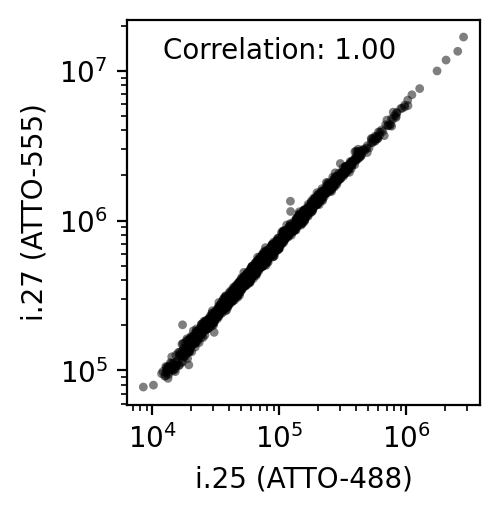

In [36]:
# plot scatter plot of total intensity
plt.figure(figsize=(5,2.5), dpi = 200)
plt.subplot(121)
plt.scatter(img_df['total_intensity_488'], img_df['total_intensity_555'], c='black', s=40, alpha=0.5, marker='.', edgecolors='none')
plt.xlabel('i.25 (ATTO-488)')
plt.ylabel('i.27 (ATTO-555)')
# plt.title('Amplicon total intensity')
# compute the correlation coefficient
correlation = np.corrcoef(img_df['total_intensity_488'], img_df['total_intensity_555'])[0, 1]
plt.text(0.1, 0.9, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes, fontsize=10)
# plt.xlim(0, 0.5e6)
# plt.ylim(0, 2e6)
# turn on log scale
plt.xscale('log')
plt.yscale('log')
# plt.subplot(122)
# # plot a smoothened histogram of the intensity ratio
# plt.hist(img_df['total_intensity_488']/img_df['total_intensity_555'], bins=20, density=True, alpha=0.2, color='blue')
# kde = scipy.stats.gaussian_kde(img_df['total_intensity_488']/img_df['total_intensity_555'])
# x = np.linspace(0, 1, 100)
# plt.plot(x, kde(x), color='black', alpha=0.5)
# plt.xlabel('Intensity Ratio (Image 488 / Image 555)')
# plt.ylabel('Density')
# plt.title('Intensity Ratio Distribution')
plt.show()

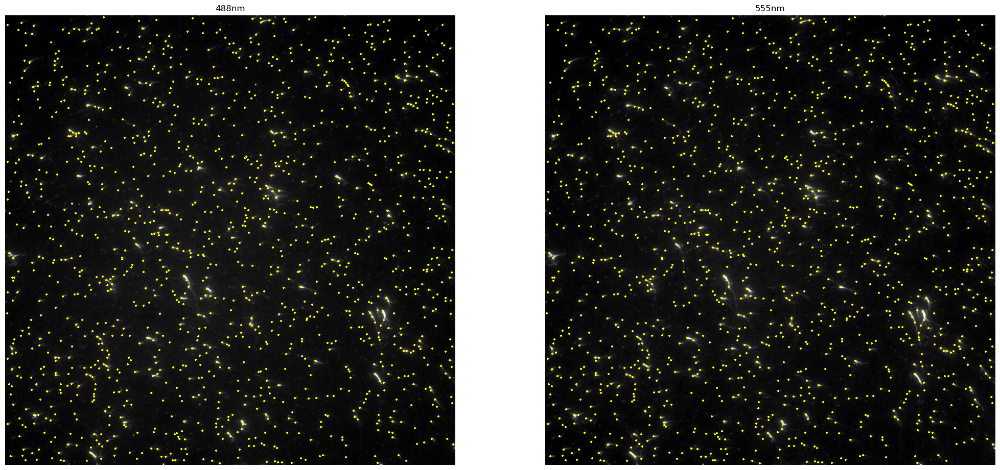

In [98]:
# plot 488 and 555 raw image overlaid with the coordinates
plt.figure(figsize=(25, 15))
plt.subplot(121)
plt.imshow(img_488, cmap='gray')
plt.title('488nm')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.axis('off')
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=12, marker = '+')
plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('555nm')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.axis('off')
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=12, marker = '+')
plt.show()

## Plot the distribution of all condition groups

In [3]:
output_dir = os.path.join(data_dir, 'dataframe')
df_files = os.listdir(output_dir)
print(df_files)

['RCA_df_100_to_0.csv', 'RCA_df_100_to_20.csv', 'RCA_df_100_to_100.csv', 'RCA_df_100_to_40.csv', 'RCA_df_100_to_60.csv', 'RCA_df_100_to_80.csv']


In [4]:
# create a new df for all the data
df_all = pd.DataFrame()

for file in df_files:
    if file.endswith('.csv'):
        # read the csv file
        df = pd.read_csv(os.path.join(output_dir, file))
        # add a new column for the filename
        df['filename'] = file[:-4].split('_')[-1]
        # append to the df_all
        df_all = pd.concat([df_all, df], ignore_index=True)
        
# set the datatype of each column
df_all['label'] = df_all['label'].astype(int)
df_all['area_488'] = df_all['area_488'].astype(int)
df_all['area_555'] = df_all['area_555'].astype(int)
df_all['mean_intensity_488'] = df_all['mean_intensity_488'].astype(float)
df_all['mean_intensity_555'] = df_all['mean_intensity_555'].astype(float)
df_all['total_intensity_488'] = df_all['total_intensity_488'].astype(float)
df_all['total_intensity_555'] = df_all['total_intensity_555'].astype(float)
df_all['filename'] = df_all['filename'].astype(int)

In [5]:
# sort using filename
df_all = df_all.sort_values(by='filename')
df_all

,label,area_488,mean_intensity_488,total_intensity_488,area_555,mean_intensity_555,total_intensity_555,filename
0,1,39,445.256410,17365.0,39,156.153846,6090.0,0
1,2,90,632.477778,56923.0,90,154.411111,13897.0,0
2,3,101,669.356436,67605.0,101,159.881188,16148.0,0
19,20,197,646.162437,127294.0,197,202.370558,39867.0,0
20,21,81,589.271605,47731.0,81,167.024691,13529.0,0
...,...,...,...,...,...,...,...,...
5133,2214,98,1196.612245,117268.0,98,8080.653061,791904.0,100
5134,2215,24,1199.333333,28784.0,24,8573.750000,205770.0,100
5135,2216,70,1053.371429,73736.0,70,7050.014286,493501.0,100
5136,2217,36,1092.138889,39317.0,36,7386.333333,265908.0,100


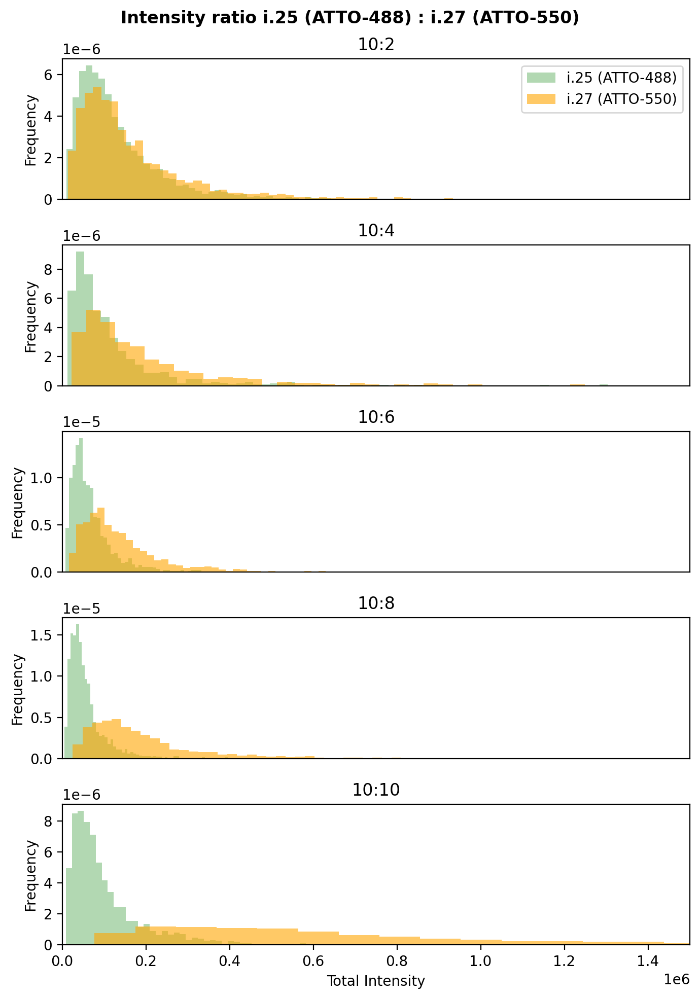

In [14]:
# for each filename, plot histogram of total_intensity_555 and total_intensity_488
plt.figure(figsize=(7, 10), dpi=200)
for i, filename in enumerate(df_all['filename'].unique()):
    if filename == 0:
        continue
    plt.subplot(5, 1, i)
    df_temp = df_all[df_all['filename'] == filename]
    plt.hist(df_temp['total_intensity_488'], bins = 'auto', color='green', alpha=0.3, label='i.25 (ATTO-488)', density=True)
    plt.hist(df_temp['total_intensity_555'], bins = 'auto', color='orange', alpha=0.6, label='i.27 (ATTO-550)', density=True)
    plt.title(f"10:{int(filename/10)}")
    plt.ylabel('Frequency')
    plt.xlim(0, 1.5e6)
    if i == 1:
        plt.legend()
    # show x ticks only for the last subplot
    if i == 5:
        plt.xlabel('Total Intensity')
    else:
        plt.xticks([])
        
# set the title of the figure, set to bold
plt.suptitle("Intensity ratio i.25 (ATTO-488) : i.27 (ATTO-550)", fontweight='bold')
    
plt.tight_layout()
plt.show()

In [55]:
# for each filename, compute the ratio of total_intensity_488 and total_intensity_555 and plot histogram on the same figure
# set a colormap with red
cmap = plt.get_cmap('Reds', len(df_all['filename'].unique())+1)


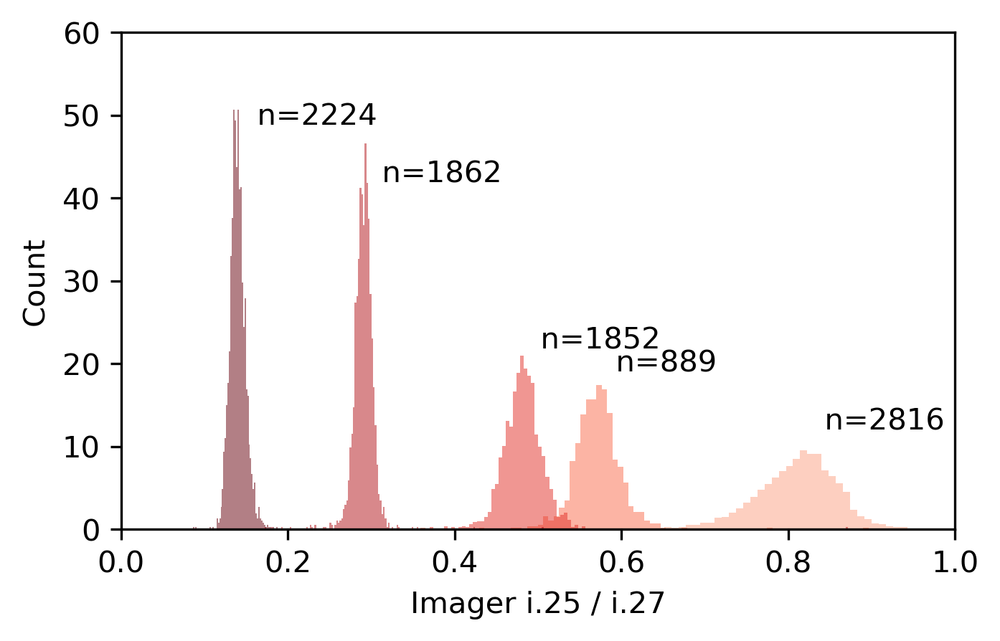

In [56]:
plt.figure(figsize=(5, 3), dpi=300)
for i, filename in enumerate(df_all['filename'].unique()):
    if i==0:
        continue
    df_temp = df_all[df_all['filename'] == filename]
    ratio = df_temp['total_intensity_488'] / df_temp['total_intensity_555']
    plt.hist(ratio, bins='auto', alpha=0.5, label=f"{filename}%", density=True, color=cmap(i+1))
    # plot a smoothened histogram of the intensity ratio
    kde = scipy.stats.gaussian_kde(ratio)
    x = np.linspace(0, 10, 1000)
    # plt.plot(x, kde(x), alpha=0.5, color=cmap(i+1))
    # print the number of datapoints on top of each histogram peak
    count = len(ratio)
    peak_y = kde(x).max()
    peak_x = x[np.argmax(kde(x))]
    plt.text(peak_x, peak_y+3, f"  n={count}", fontsize=10, color="black")
plt.xlabel('Imager i.25 / i.27')
plt.ylabel('Count')
# plt.title('Amplicon Intensity Ratio Distribution')
# set x into log scale
# plt.xscale('log')
plt.xlim(0, 1)
plt.ylim(0, 60)
# plt.legend()
plt.show()

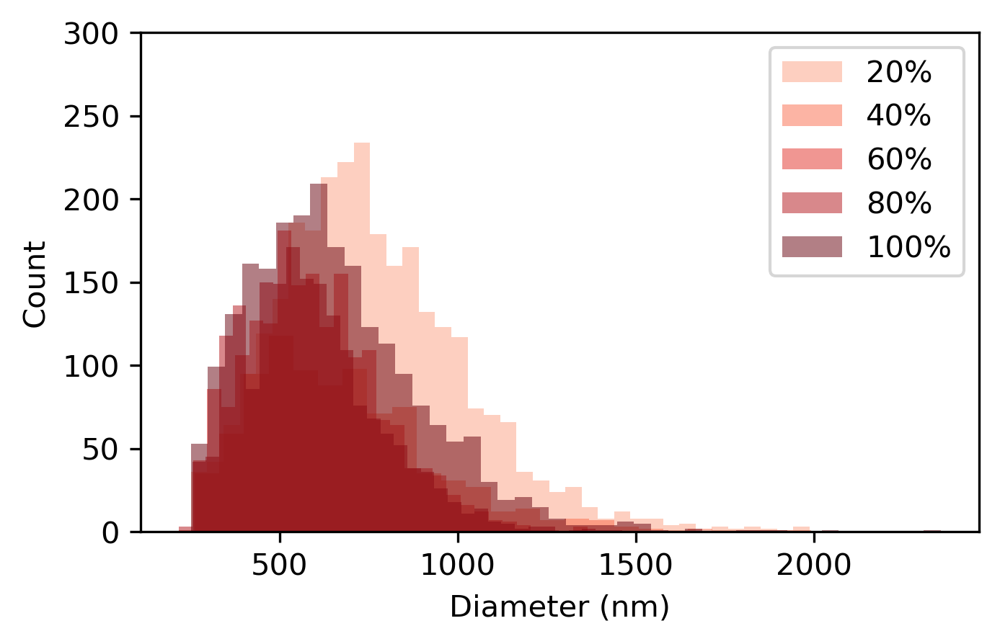

mean diameter 656.0676473414527
median diameter 625.8403585095913


In [64]:
voxel_size = 0.0642498 # um/pixel

plt.figure(figsize=(5, 3), dpi=300)
mean = 0
median = 0
for i, filename in enumerate(df_all['filename'].unique()):
    if i==0:
        continue
    df_temp = df_all[df_all['filename'] == filename]
    # assuming all areas are circle, compute the diameter
    diameter = np.sqrt(df_temp['area_488']/np.pi) * 2 * voxel_size * 1000
    mean += diameter.mean()
    median += diameter.median()
    plt.hist(diameter, bins='auto', alpha=0.5, label=f"{filename}%", density=False, color=cmap(i+1))
    
plt.xlabel('Diameter (nm)')
plt.ylabel('Count')
# plt.title('Amplicon Area Distribution')
# set x into log scale
# plt.xscale('log')
# plt.xlim(0, 1)
plt.ylim(0, 300)
plt.legend()
plt.show()

print("mean diameter", mean/5)
print("median diameter", median/5)

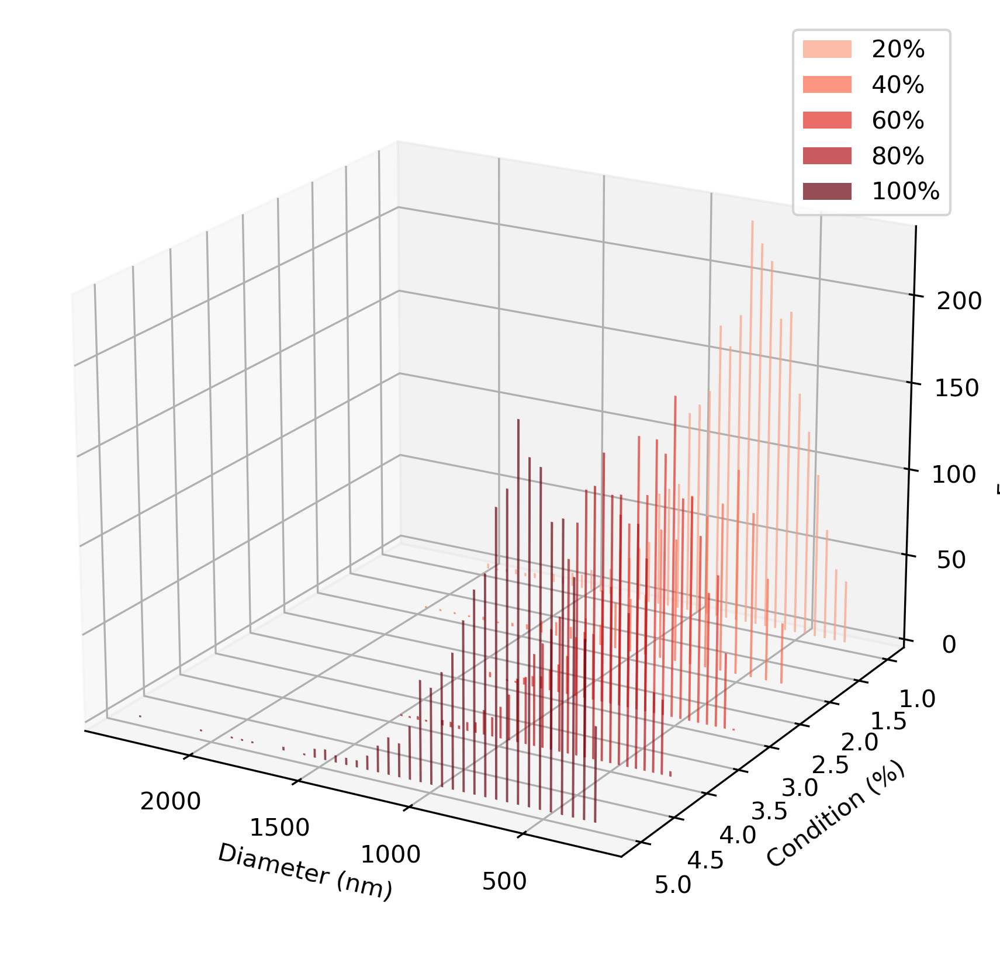

In [16]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7), dpi=300)
ax = fig.add_subplot(111, projection='3d')

for i, filename in enumerate(df_all['filename'].unique()):
    if i == 0:
        continue
    df_temp = df_all[df_all['filename'] == filename]
    # Assuming all areas are circles, compute the diameter
    diameter = np.sqrt(df_temp['area_488'] / np.pi) * 2 * voxel_size * 1000
    hist, bins = np.histogram(diameter, bins='auto', density=False)
    # Compute the center of each bin
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    # Plot the histogram as a bar in 3D
    ax.bar(bin_centers, hist, zs=i, zdir='y', alpha=0.7, label=f"{filename}%", color=cmap(i+1), width=10)

ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Condition (%)')
ax.set_zlabel('Frequency')
ax.view_init(elev=20, azim=120)  # Adjust the viewing angle
plt.legend()
plt.show()